# Setup


In [1]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.4 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


KeyboardInterrupt: 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Import and Register  Data

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train1", {}, "/content/drive/MyDrive/blackandwhitecoco/train_annotations.coco.json", "/content/drive/MyDrive/blackandwhitecoco/BWIMAGES/train/combined")
register_coco_instances("my_dataset_test1", {}, "/content/drive/MyDrive/blackandwhitecoco/test_annotations.coco.json", "/content/drive/MyDrive/blackandwhitecoco/BWIMAGES/test/combined")

[06/18 04:59:31 d2.data.datasets.coco]: Loaded 113 images in COCO format from /content/drive/MyDrive/blackandwhitecoco/train_annotations.coco.json


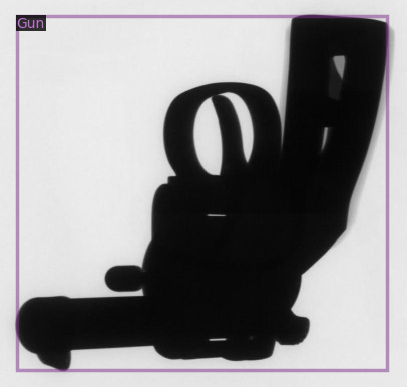

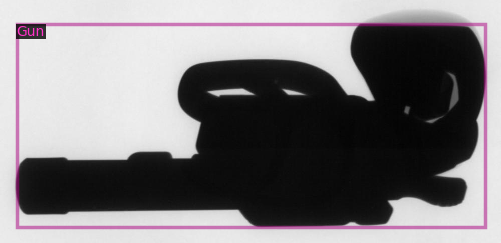

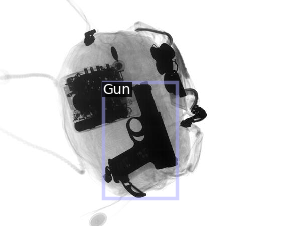

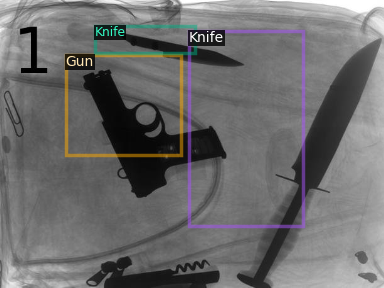

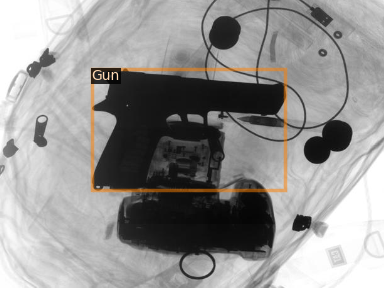

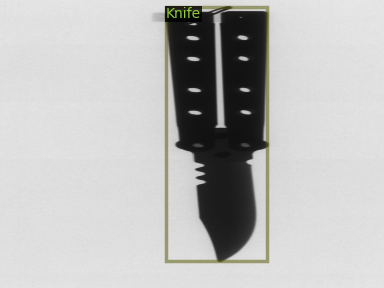

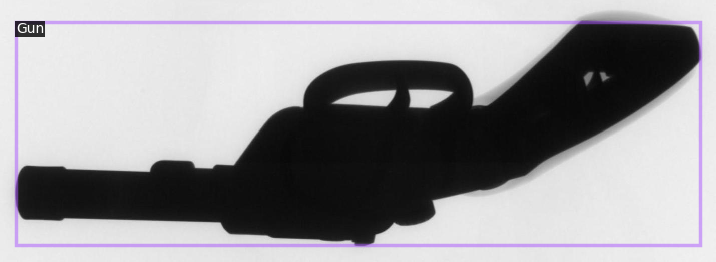

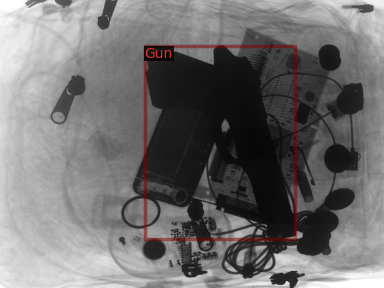

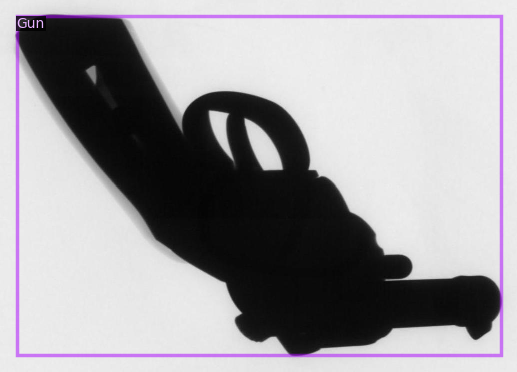

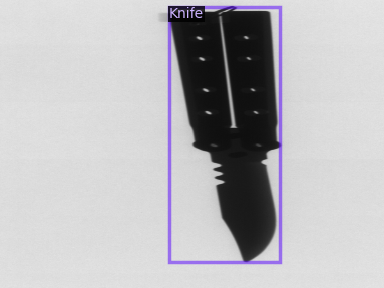

In [8]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train1")
dataset_dicts = DatasetCatalog.get("my_dataset_train1")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [15]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001  # Lower the learning rate
cfg.SOLVER.MAX_ITER = 500
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # Adjust based on the number of classes


# Create the trainer
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


[06/18 05:13:39 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 153MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[06/18 05:13:41 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[06/18 05:13:50 d2.utils.events]:  eta: 0:03:25  iter: 19  total_loss: 1.797  loss_cls: 1.255  loss_box_reg: 0.5167  loss_rpn_cls: 0.003736  loss_rpn_loc: 0.01911    time: 0.4306  last_time: 0.4178  data_time: 0.0394  last_data_time: 0.0069   lr: 3.8962e-05  max_mem: 8678M
[06/18 05:13:58 d2.utils.events]:  eta: 0:03:12  iter: 39  total_loss: 1.146  loss_cls: 0.6422  loss_box_reg: 0.4824  loss_rpn_cls: 0.003164  loss_rpn_loc: 0.01553    time: 0.4133  last_time: 0.4549  data_time: 0.0088  last_data_time: 0.0274   lr: 7.8922e-05  max_mem: 8678M
[06/18 05:14:06 d2.utils.events]:  eta: 0:03:06  iter: 59  total_loss: 0.9542  loss_cls: 0.417  loss_box_reg: 0.5237  loss_rpn_cls: 0.001835  loss_rpn_loc: 0.01108    time: 0.4181  last_time: 0.4940  data_time: 0.0204  last_data_time: 0.0073   lr: 0.00011888  max_mem: 8678M
[06/18 05:14:15 d2.utils.events]:  eta: 0:02:58  iter: 79  total_loss: 0.858  loss_cls: 0.3227  loss_box_reg: 0.4795  loss_rpn_cls: 0.003189  loss_rpn_loc: 0.01304    time: 0.4

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [16]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("my_dataset_test1", )
predictor = DefaultPredictor(cfg)

[06/18 05:17:35 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


# Predictions and Testing




In [21]:
test_metadata = MetadataCatalog.get("my_dataset_test1")

In [23]:
class_names = ['Gun', 'Knife'] # Replace with your actual class names


In [24]:
from detectron2.data import MetadataCatalog

# Assuming your dataset name is "my_dataset_test"
test_metadata = MetadataCatalog.get("my_dataset_test")

# Add class names to the metadata
test_metadata.thing_classes = class_names

# Print the metadata to ensure it includes class names
print("Class names in test_metadata:", test_metadata.thing_classes)


Class names in test_metadata: ['Gun', 'Knife']


{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[159.9454,  23.7158, 430.5688, 532.4800]], device='cuda:0')), scores: tensor([0.9834], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


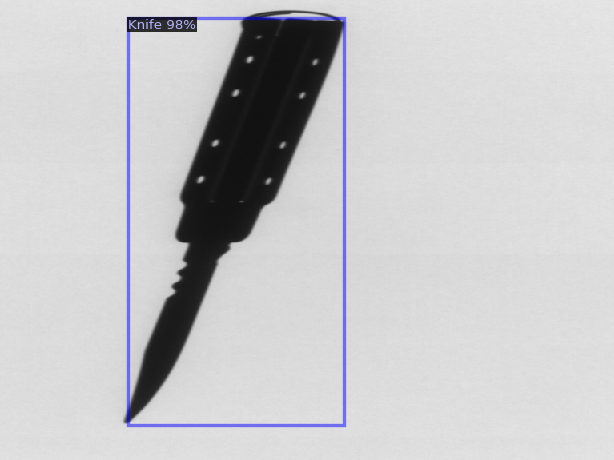

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[1.5617e+02, 1.2839e-01, 4.2915e+02, 5.3720e+02]], device='cuda:0')), scores: tensor([0.9817], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


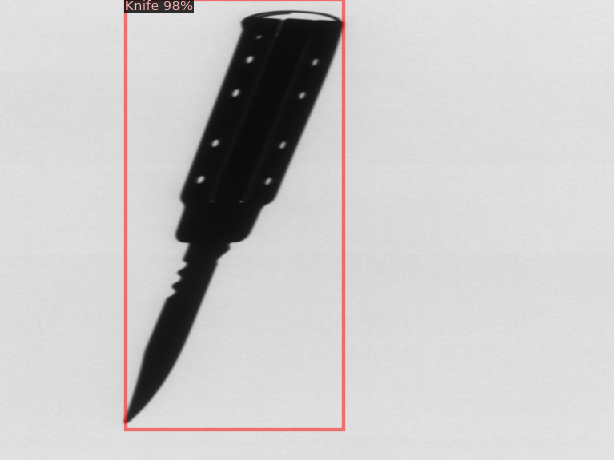

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[186.3539,  26.1842, 465.2582, 559.1440]], device='cuda:0')), scores: tensor([0.9880], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


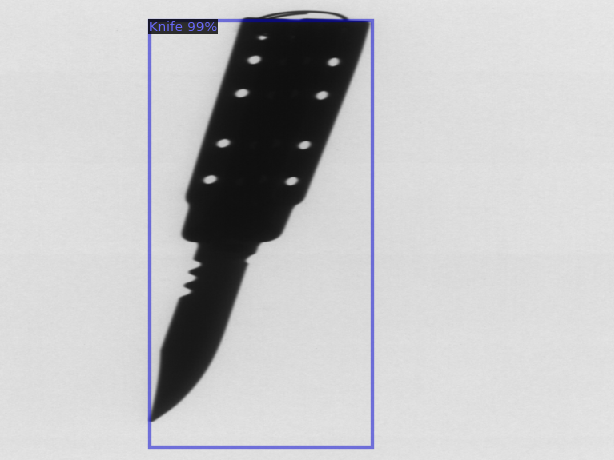

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[188.3774,  26.1747, 466.7688, 556.6448]], device='cuda:0')), scores: tensor([0.9877], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


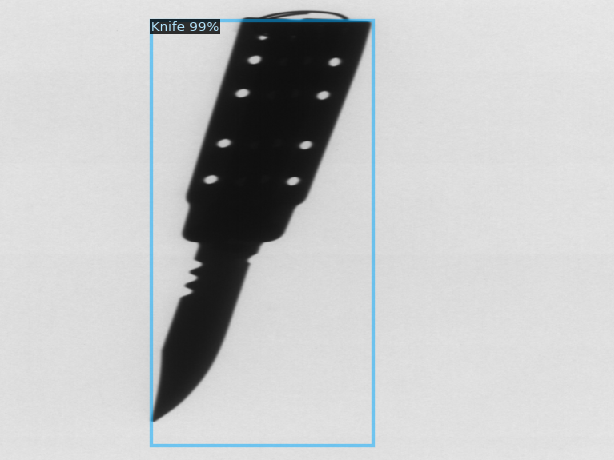

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[231.3279,  23.4416, 491.1895, 521.2721]], device='cuda:0')), scores: tensor([0.9930], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


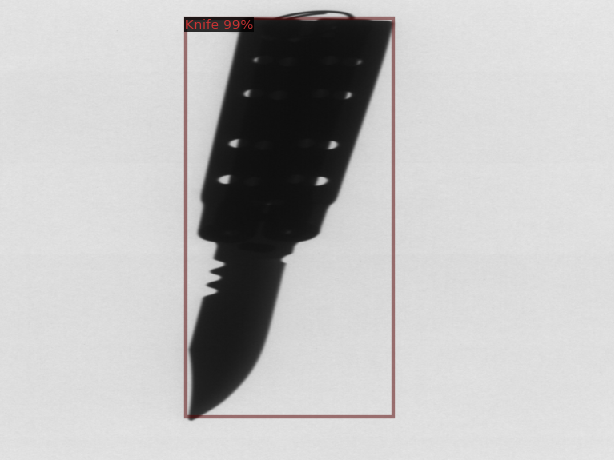

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[231.8678,  22.4543, 489.4284, 516.8292]], device='cuda:0')), scores: tensor([0.9916], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


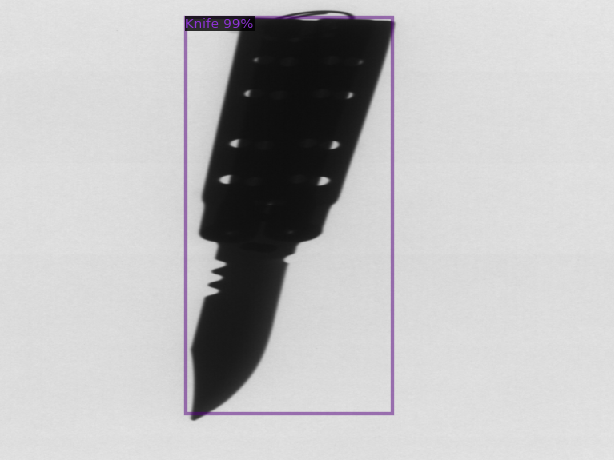

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[275.4085,  24.8685, 513.2200, 514.3586]], device='cuda:0')), scores: tensor([0.9914], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


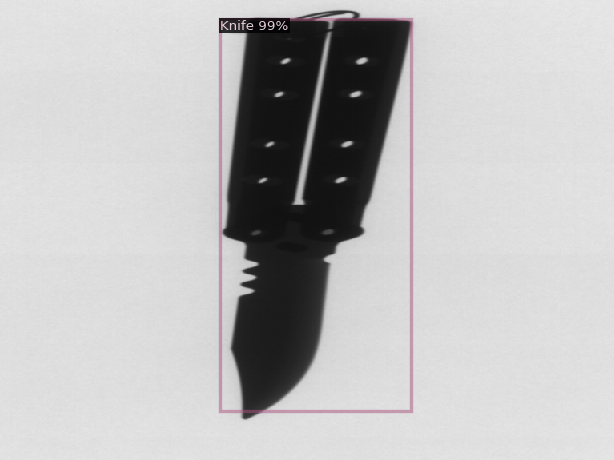

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[273.6016,  26.7956, 511.8116, 513.4403]], device='cuda:0')), scores: tensor([0.9923], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


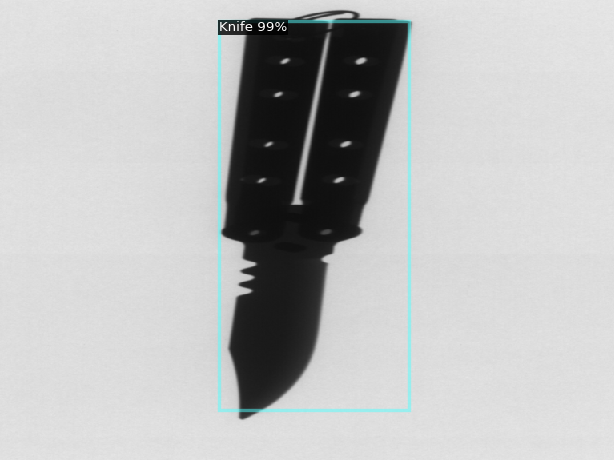

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[315.8858,  26.3729, 528.4034, 513.2997]], device='cuda:0')), scores: tensor([0.9872], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


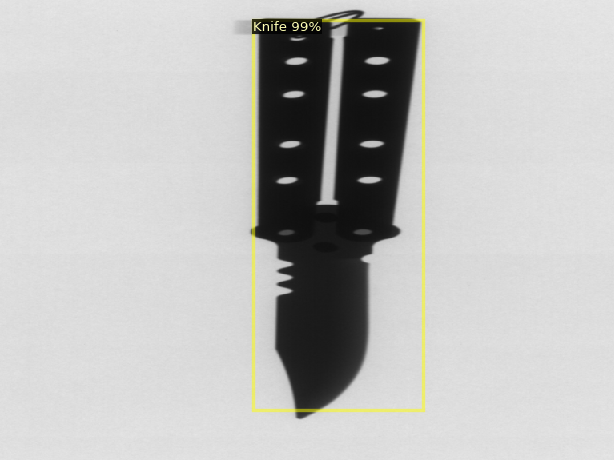

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[312.5423,  25.8696, 529.4354, 513.8728]], device='cuda:0')), scores: tensor([0.9868], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


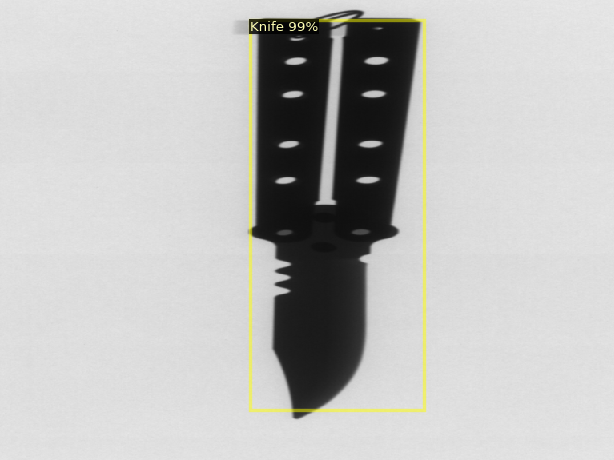

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[329.2885,  24.6782, 538.2181, 520.7425]], device='cuda:0')), scores: tensor([0.9878], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


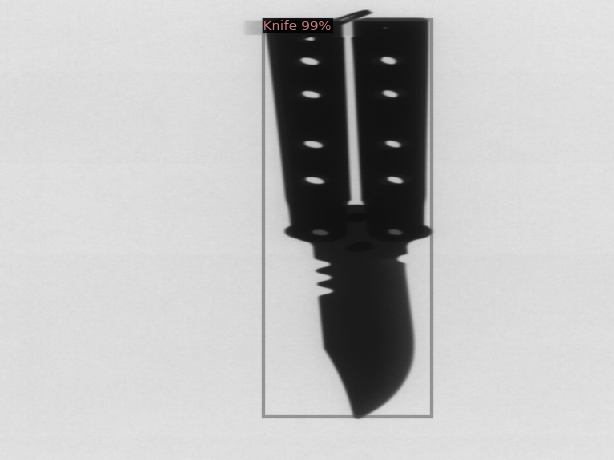

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[328.2266,  23.3881, 537.5689, 521.1989]], device='cuda:0')), scores: tensor([0.9880], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


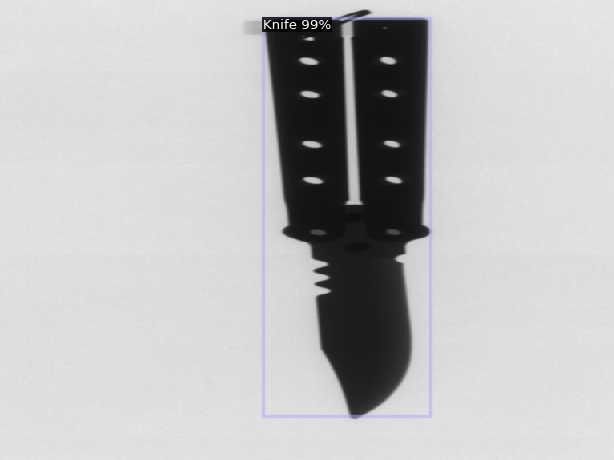

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[340.5861,  22.7965, 563.7421, 512.6599]], device='cuda:0')), scores: tensor([0.9907], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


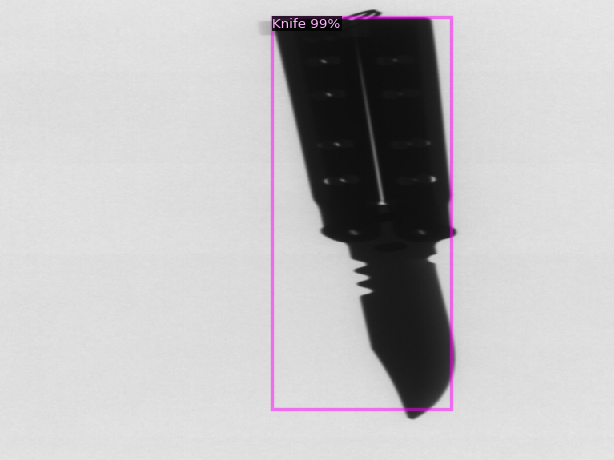

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[344.8950,  22.3858, 566.5936, 517.9119]], device='cuda:0')), scores: tensor([0.9917], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


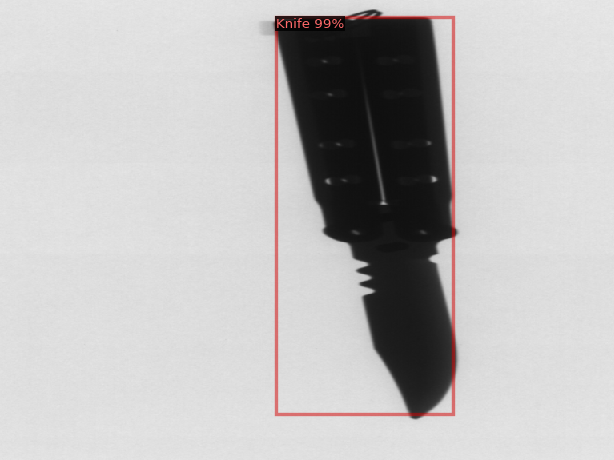

{'instances': Instances(num_instances=2, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[101.5521,  69.7272, 579.6307, 428.6138],
        [220.0492,   5.4660, 467.7673,  37.4309]], device='cuda:0')), scores: tensor([0.9812, 0.9690], device='cuda:0'), pred_classes: tensor([1, 1], device='cuda:0')])}


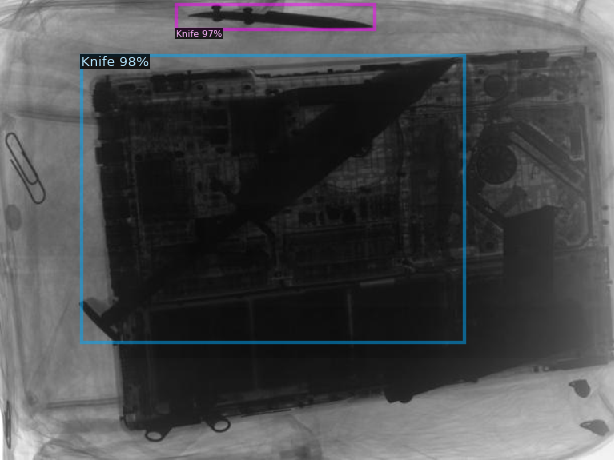

{'instances': Instances(num_instances=2, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[0.0000e+00, 5.6863e+01, 4.8497e+02, 4.2420e+02],
        [1.5691e+02, 2.1565e-01, 4.2083e+02, 2.7400e+01]], device='cuda:0')), scores: tensor([0.9904, 0.9730], device='cuda:0'), pred_classes: tensor([1, 1], device='cuda:0')])}


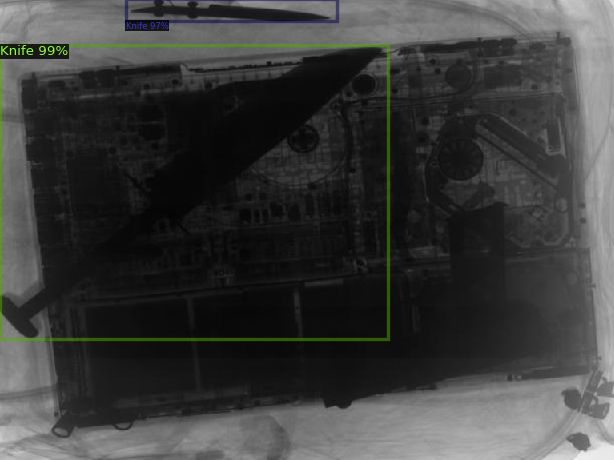

{'instances': Instances(num_instances=2, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[474.3191, 107.5122, 676.1304, 400.0855],
        [100.7980,  83.7294, 658.3784, 408.0127]], device='cuda:0')), scores: tensor([0.8820, 0.6043], device='cuda:0'), pred_classes: tensor([1, 0], device='cuda:0')])}


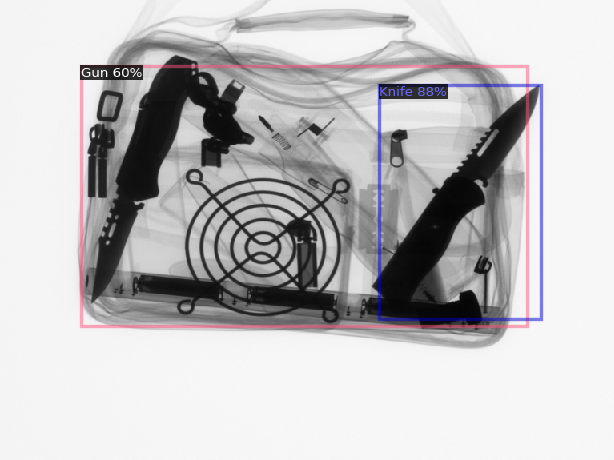

{'instances': Instances(num_instances=3, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[466.9072,  59.3625, 515.0355, 356.3260],
        [240.4080, 263.8452, 577.3991, 546.4615],
        [292.9203,  55.0557, 464.5031, 249.5416]], device='cuda:0')), scores: tensor([0.9809, 0.9657, 0.7162], device='cuda:0'), pred_classes: tensor([1, 0, 0], device='cuda:0')])}


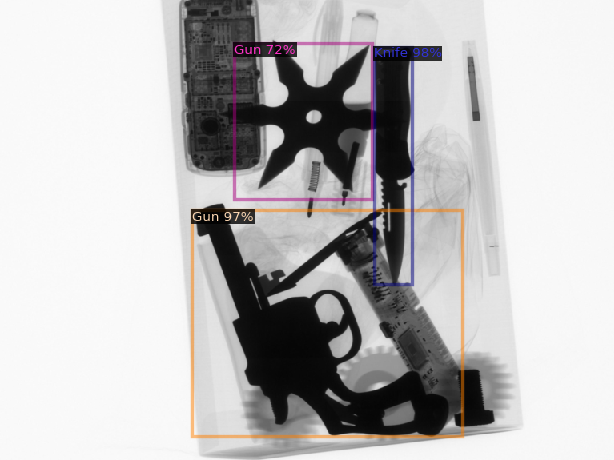

{'instances': Instances(num_instances=2, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[ 68.4428,  81.2184, 349.1530, 276.1881],
        [205.5436,   0.0000, 716.0577, 461.5747]], device='cuda:0')), scores: tensor([0.9755, 0.9180], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


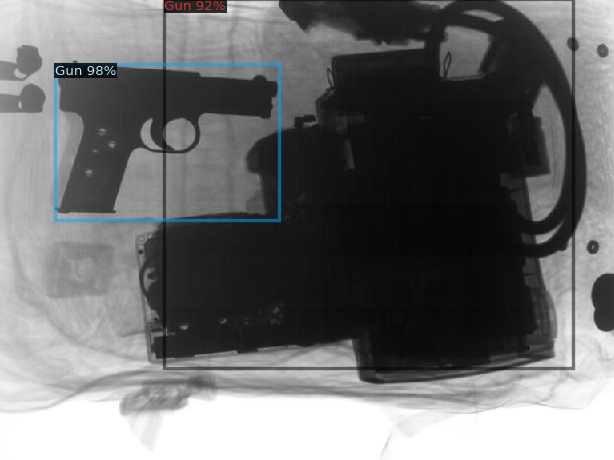

{'instances': Instances(num_instances=1, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[246.4501,  17.7310, 416.9972, 360.6656]], device='cuda:0')), scores: tensor([0.5090], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


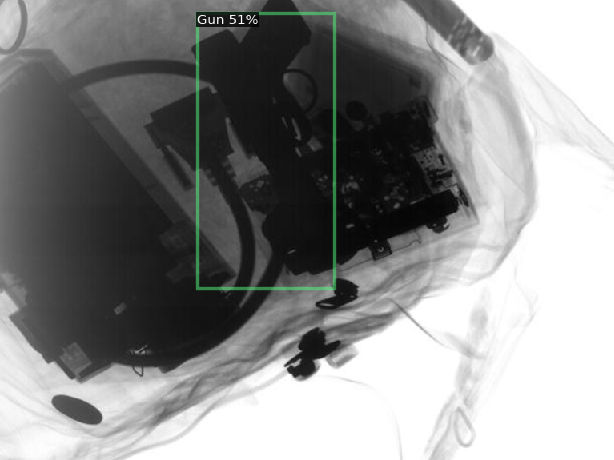

{'instances': Instances(num_instances=1, image_height=452, image_width=612, fields=[pred_boxes: Boxes(tensor([[240.5639,  11.2500, 390.4326, 279.2499]], device='cuda:0')), scores: tensor([0.9079], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


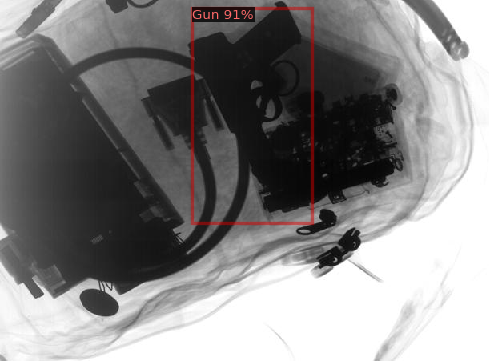

{'instances': Instances(num_instances=1, image_height=452, image_width=612, fields=[pred_boxes: Boxes(tensor([[154.4429,  81.2614, 464.7461, 316.3925]], device='cuda:0')), scores: tensor([0.9919], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


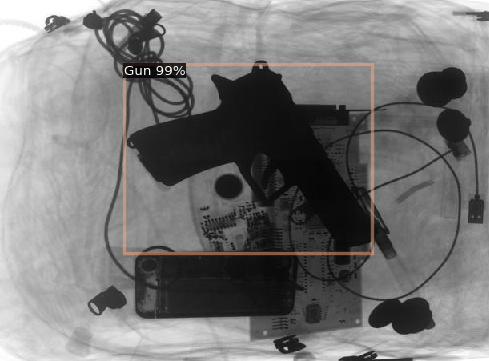

{'instances': Instances(num_instances=2, image_height=452, image_width=612, fields=[pred_boxes: Boxes(tensor([[8.5177e+01, 1.4655e-01, 3.6206e+02, 2.4714e+02],
        [6.0978e+01, 2.4562e+00, 3.7156e+02, 3.5659e+02]], device='cuda:0')), scores: tensor([0.9048, 0.5138], device='cuda:0'), pred_classes: tensor([0, 1], device='cuda:0')])}


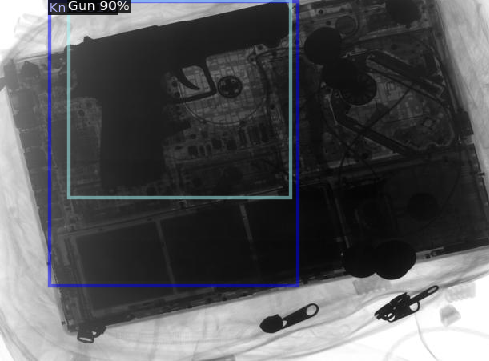

{'instances': Instances(num_instances=2, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[168.7509, 365.0638, 600.3118, 547.6577],
        [244.0676, 375.8760, 472.8382, 538.2986]], device='cuda:0')), scores: tensor([0.9469, 0.5035], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


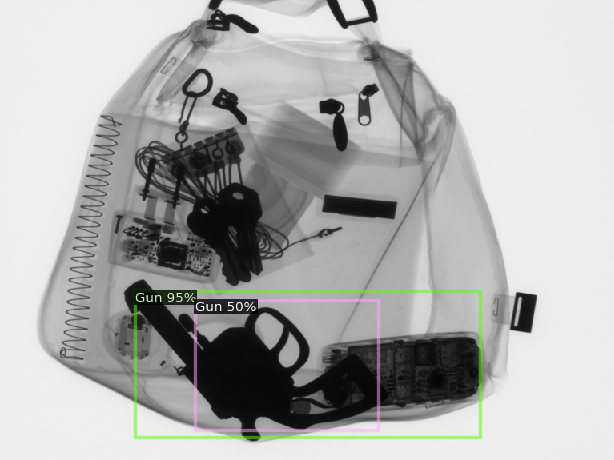

{'instances': Instances(num_instances=1, image_height=769, image_width=1198, fields=[pred_boxes: Boxes(tensor([[  29.4783,   28.6726, 1173.4177,  732.3515]], device='cuda:0')), scores: tensor([0.9922], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


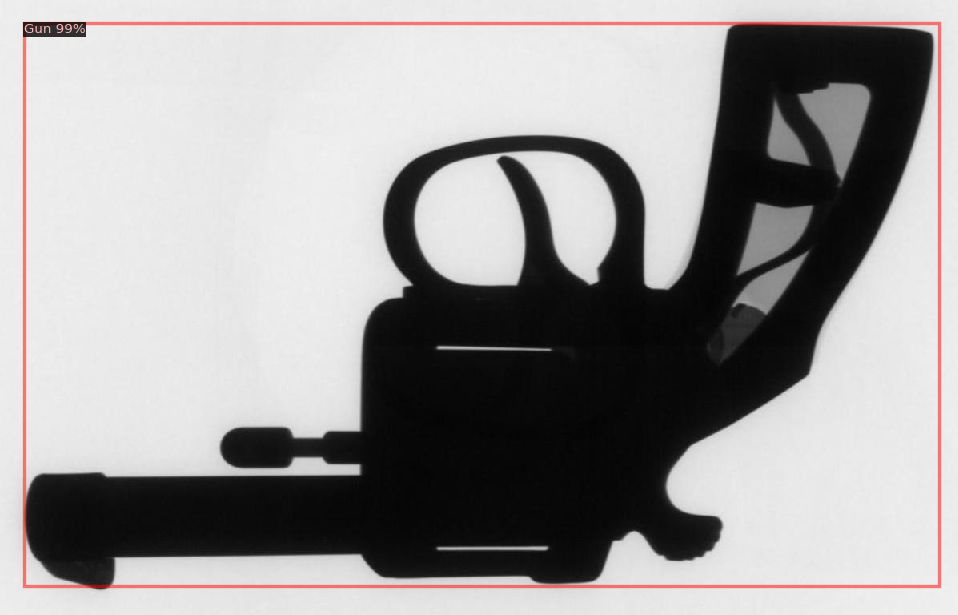

{'instances': Instances(num_instances=2, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[386.2363,  77.9152, 607.5749, 336.7643],
        [237.6781,  81.1293, 381.1357, 431.7863]], device='cuda:0')), scores: tensor([0.9917, 0.6674], device='cuda:0'), pred_classes: tensor([0, 1], device='cuda:0')])}


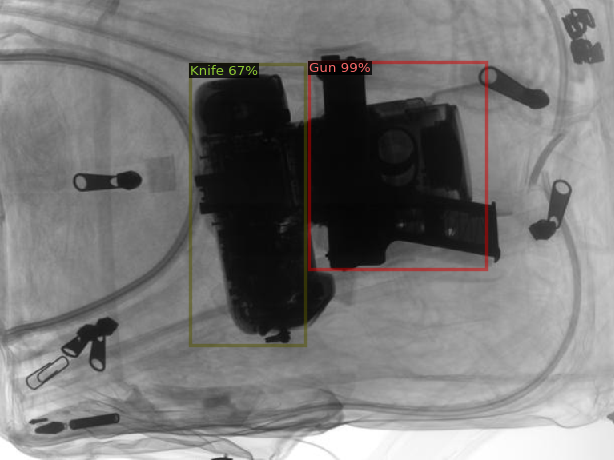

{'instances': Instances(num_instances=2, image_height=452, image_width=612, fields=[pred_boxes: Boxes(tensor([[171.7040,  69.2269, 494.6720, 291.7932],
        [142.5253, 212.8401, 402.5386, 444.6320]], device='cuda:0')), scores: tensor([0.9944, 0.7857], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


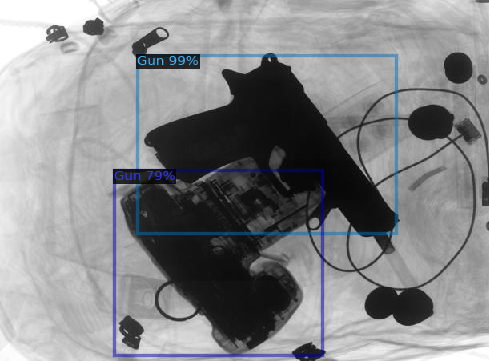

{'instances': Instances(num_instances=1, image_height=781, image_width=1292, fields=[pred_boxes: Boxes(tensor([[  21.0312,   40.0404, 1283.3730,  726.8745]], device='cuda:0')), scores: tensor([0.9906], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


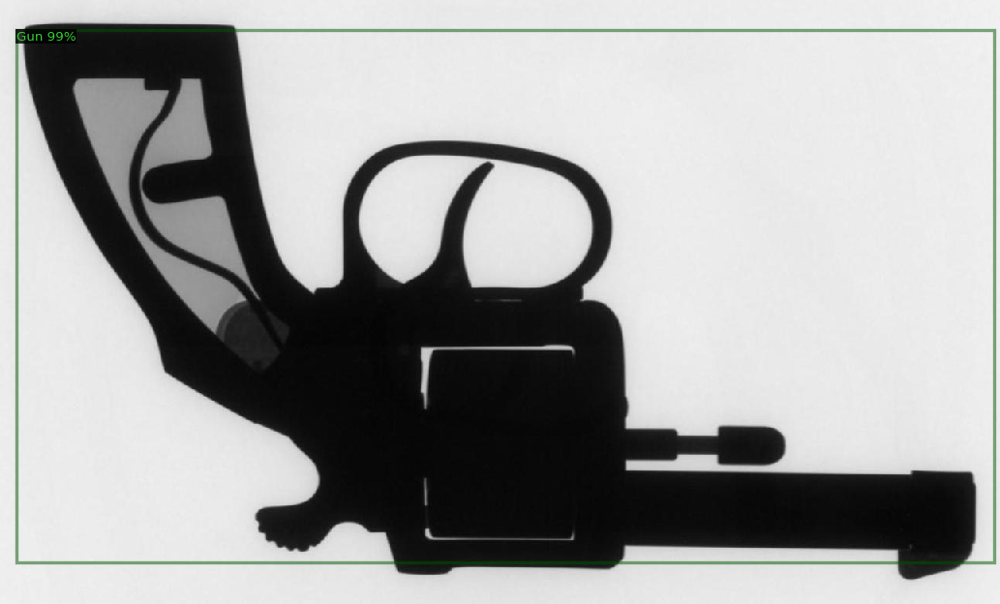

{'instances': Instances(num_instances=1, image_height=698, image_width=1299, fields=[pred_boxes: Boxes(tensor([[  51.3580,   40.0112, 1242.1344,  667.1060]], device='cuda:0')), scores: tensor([0.9895], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


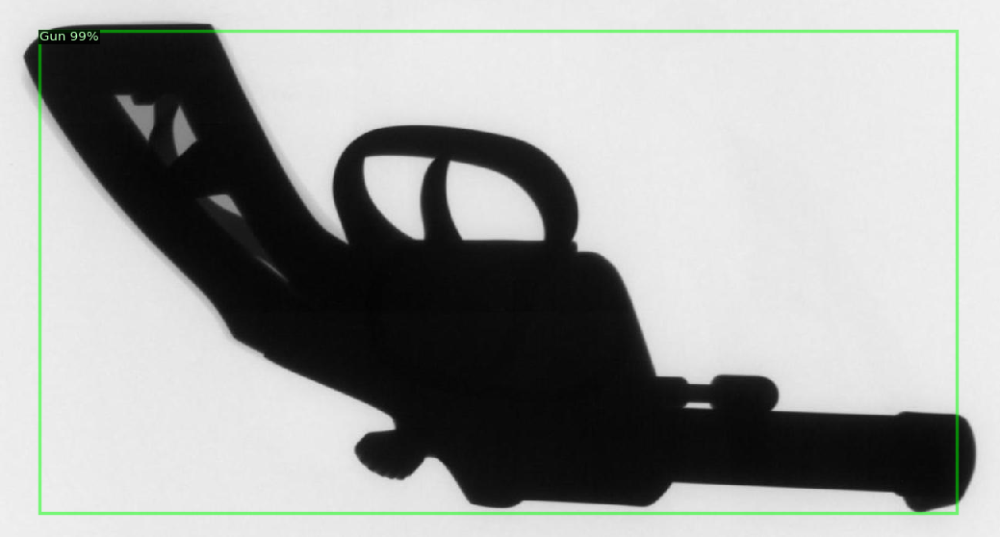

{'instances': Instances(num_instances=1, image_height=703, image_width=1311, fields=[pred_boxes: Boxes(tensor([[  32.0195,   43.7475, 1259.9324,  674.7152]], device='cuda:0')), scores: tensor([0.9913], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


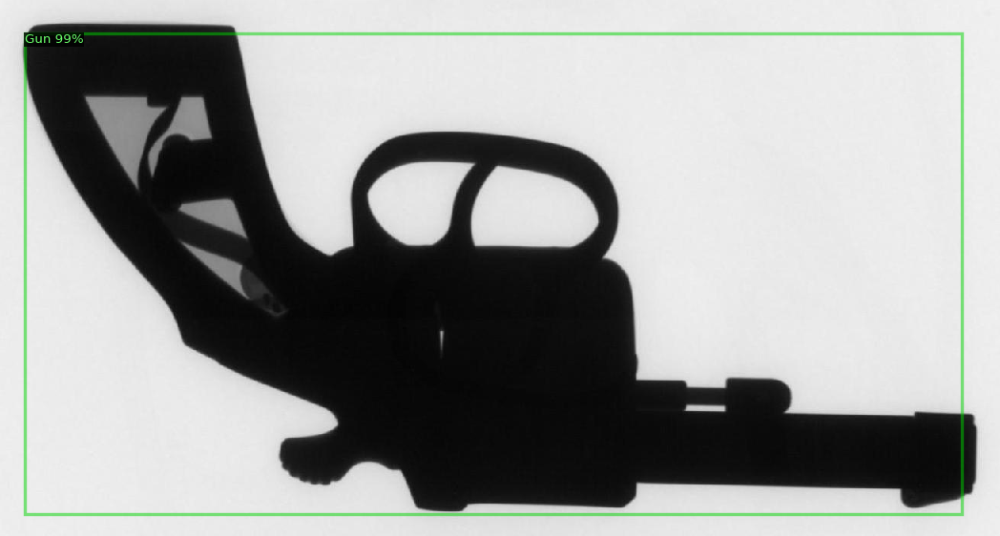

{'instances': Instances(num_instances=1, image_height=787, image_width=1156, fields=[pred_boxes: Boxes(tensor([[   8.7312,   24.7816, 1135.4452,  772.9874]], device='cuda:0')), scores: tensor([0.9906], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


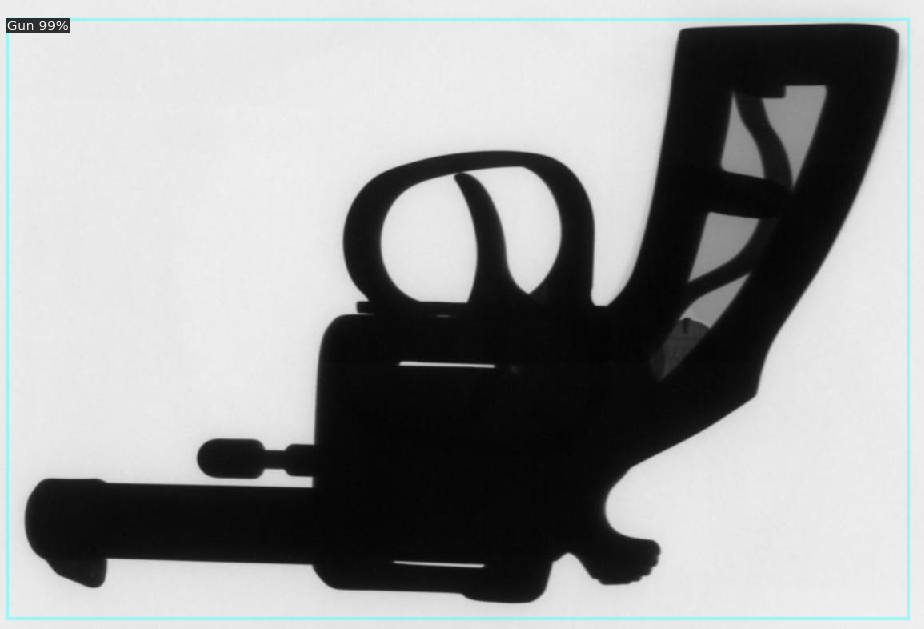

{'instances': Instances(num_instances=1, image_height=772, image_width=1309, fields=[pred_boxes: Boxes(tensor([[  27.8693,   35.0098, 1279.0410,  745.9197]], device='cuda:0')), scores: tensor([0.9884], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


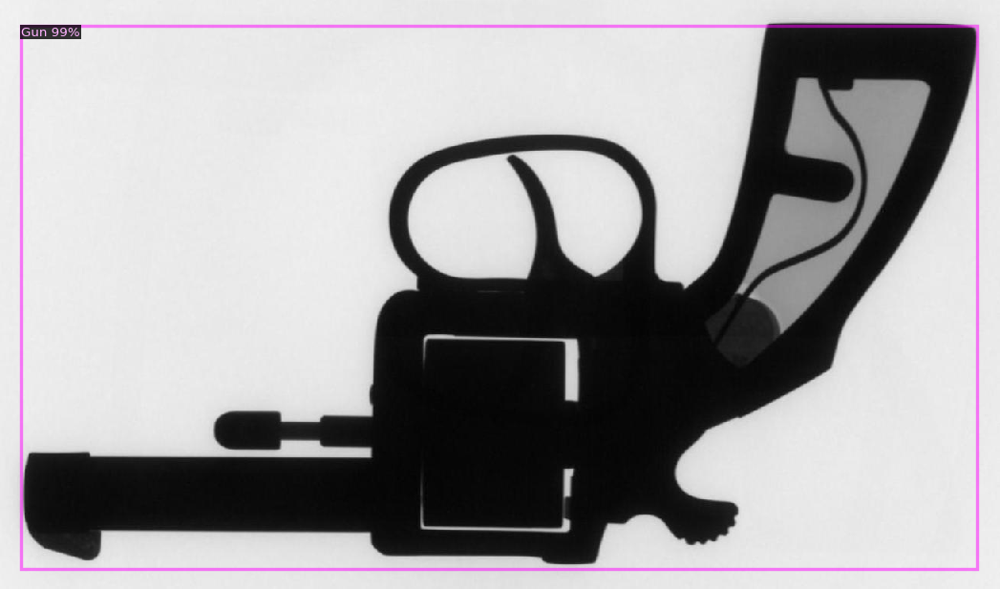

{'instances': Instances(num_instances=2, image_height=576, image_width=768, fields=[pred_boxes: Boxes(tensor([[339.8049, 155.0590, 641.4448, 449.6550],
        [328.2093, 202.3414, 600.8368, 348.3597]], device='cuda:0')), scores: tensor([0.7933, 0.5237], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


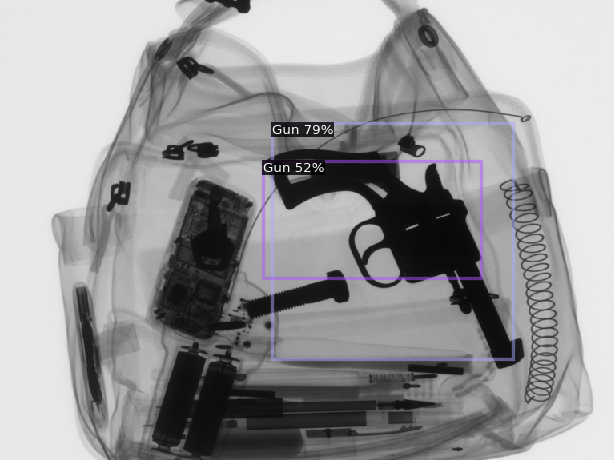

In [25]:
from detectron2.utils.visualizer import ColorMode, Visualizer
import glob
import cv2
from google.colab.patches import cv2_imshow

# Path to your test images
image_paths = glob.glob('/content/drive/MyDrive/blackandwhitecoco/BWIMAGES/test/combined/*png')
for imageName in image_paths:
    im = cv2.imread(imageName)
    outputs = predictor(im)

    # Check the outputs to ensure predictions are being made
    print(outputs)

    # Visualize the predictions
    v = Visualizer(
        im[:, :, ::-1],
        metadata=test_metadata,
        scale=0.8,
        instance_mode=ColorMode.IMAGE  # Change to ColorMode.IMAGE_BW if you want black & white
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Display the image with bounding boxes and class names
    cv2_imshow(out.get_image()[:, :, ::-1])


In [26]:
import os
import json
import glob
import cv2
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# Define class names (should be the same as those used during training)
class_names = ['Gun', 'Knife'] # Replace with your actual class names

# Add class names to the metadata
test_metadata = MetadataCatalog.get("my_dataset_test1")
test_metadata.thing_classes = class_names

# Path to your test images
image_paths = glob.glob('/content/drive/MyDrive/blackandwhitecoco/BWIMAGES/test/combined/*png')

# Create a list to hold the annotation data
annotations = []
images = []

# Iterate over the images and make predictions
for idx, imageName in enumerate(image_paths):
    im = cv2.imread(imageName)
    outputs = predictor(im)

    # Prepare the image data entry
    height, width = im.shape[:2]
    image_entry = {
        "id": idx,
        "file_name": os.path.basename(imageName),
        "height": height,
        "width": width
    }
    images.append(image_entry)

    # Iterate over the predictions
    instances = outputs["instances"].to("cpu")
    boxes = instances.pred_boxes.tensor.numpy()
    scores = instances.scores.numpy()
    classes = instances.pred_classes.numpy()

    for box, score, cls in zip(boxes, scores, classes):
        x_min, y_min, x_max, y_max = box
        width = x_max - x_min
        height = y_max - y_min

        annotation = {
            "id": len(annotations),
            "image_id": idx,
            "category_id": int(cls) + 1,  # Category ID should start from 1 in COCO format
            "bbox": [float(x_min), float(y_min), float(width), float(height)],
            "area": float(width * height),
            "segmentation": [],
            "iscrowd": 0,
            "score": float(score)  # Include the score if needed
        }
        annotations.append(annotation)

# Prepare the categories
categories = []
for idx, class_name in enumerate(class_names):
    category = {
        "id": idx + 1,
        "name": class_name,
        "supercategory": "none"
    }
    categories.append(category)

# Prepare the final COCO format data
coco_format = {
    "images": images,
    "annotations": annotations,
    "categories": categories
}

# Save to JSON file
output_file = '/content/predictions_coco_format.json'
with open(output_file, 'w') as f:
    json.dump(coco_format, f)

print(f"COCO format predictions saved to {output_file}")


COCO format predictions saved to /content/predictions_coco_format.json
